In [1]:
!nvidia-smi

Sat Mar  4 14:21:13 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P0    32W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install diffusers==0.11.1
!pip install transformers scipy ftfy accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 KB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 23.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 89.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 KB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 115.1 MB/s eta 0:00:00


In [3]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)  

Fetching 20 files:   0%|          | 0/20 [00:00<?, ?it/s]

The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


Next, let's move the pipeline to GPU to have faster inference.

In [4]:
pipe = pipe.to("cuda")

And we are ready to generate images:

  0%|          | 0/50 [00:00<?, ?it/s]

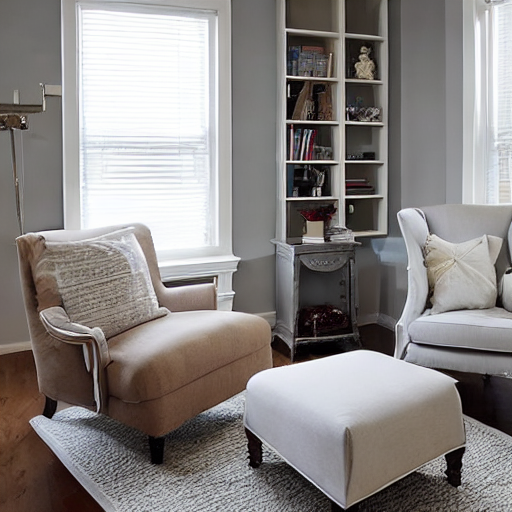

In [5]:
prompt = "The walls of the room are painted in a soft gray hue, creating a calming atmosphere. The hardwood floor is covered with a light-colored rug, and a couple of accent chairs with a matching ottoman are positioned in the corner of the room, creating a cozy reading nook."
image = pipe(prompt).images[0]  
image.save(f"astronaut_rides_horse.png")
image

Running the above cell multiple times will give you a different image every time. If you want deterministic output you can pass a random seed to the pipeline. Every time you use the same seed you'll have the same image result.

  0%|          | 0/50 [00:00<?, ?it/s]

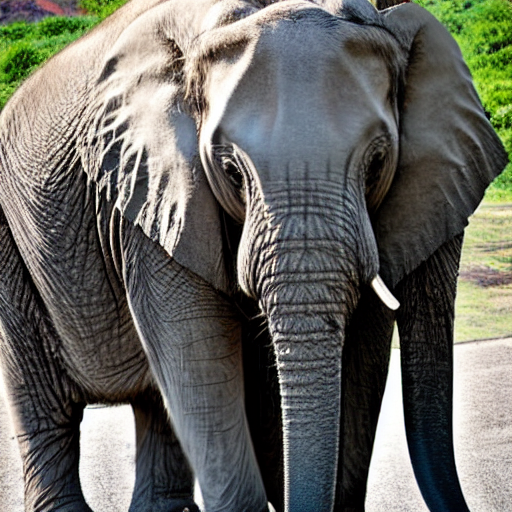

In [24]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, generator=generator).images[0]

image

  0%|          | 0/15 [00:00<?, ?it/s]

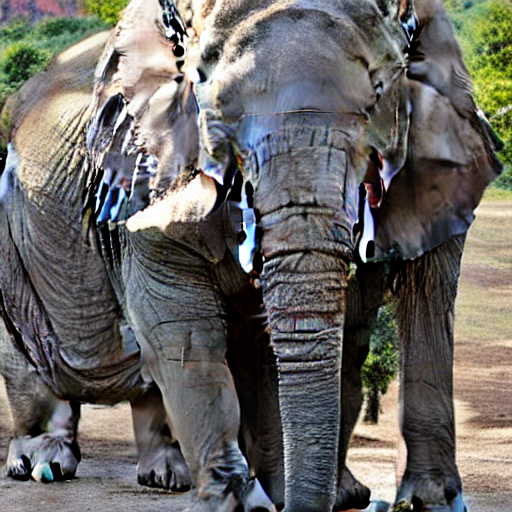

In [25]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, num_inference_steps=15, generator=generator).images[0]

image

In [7]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['position,', 'position,', 'position,', 'position,']


  0%|          | 0/150 [00:00<?, ?it/s]

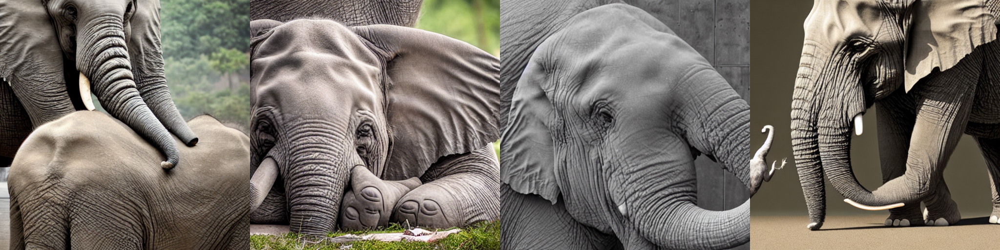

In [26]:
num_images = 4
prompt = ["a large elephant sits with its legs folded under its massive body, while a small cat stands before it, gazing up in curiosity. The elephant appears calm and content, with its trunk curled up and ears relaxed, while the cat seems fascinated by the unusual creature before it. The contrasting textures of the elephant's wrinkled skin and the cat's soft fur create an intriguing visual juxtaposition,"] * num_images

images = pipe(prompt,num_inference_steps=150).images

grid = image_grid(images, rows=1, cols=4)
grid

And here's how to generate a grid of `n × m` images.

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features']


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features']


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features']


  0%|          | 0/50 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features', 'be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features']


  0%|          | 0/50 [00:00<?, ?it/s]

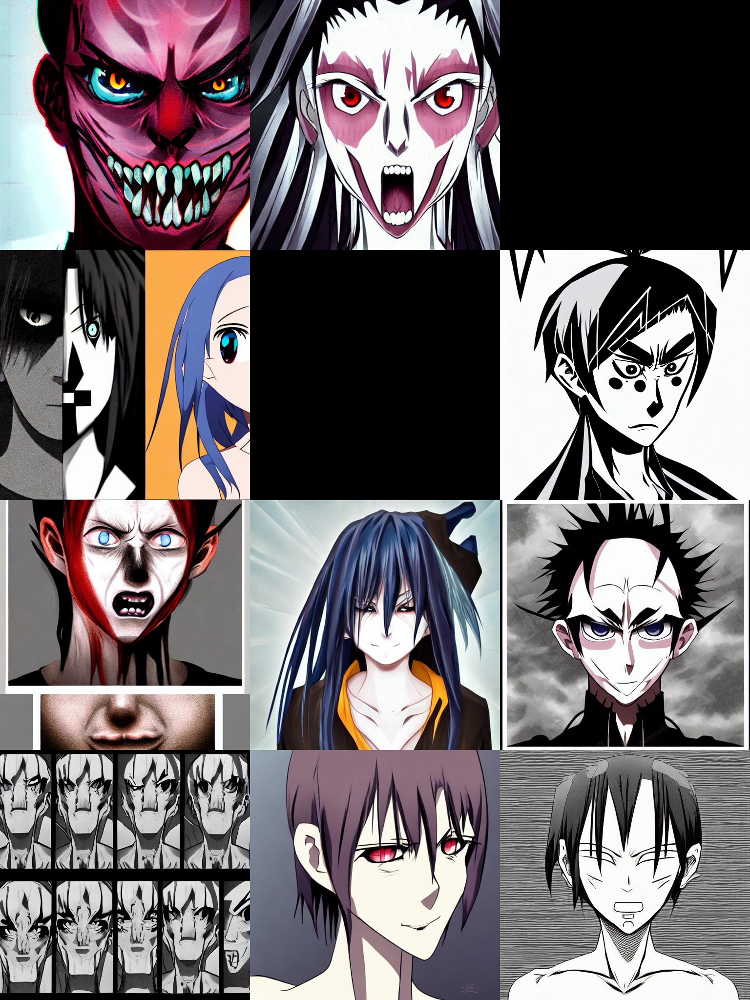

In [28]:
num_cols = 3
num_rows = 4

prompt = [" scary anime character typically has sharp and angular features, such as a prominent nose or cheekbones. Their eyes are often small and piercing, with a narrow and intense gaze. The eyebrows are often furrowed, adding to the character's intimidating expression. The mouth may be twisted in a sneer or a grimace, with jagged teeth or a sinister smile. Their skin may be pale or have a sickly pallor, and they may have scars, markings, or other distinguishing features"] * num_cols

all_images = []
for i in range(num_rows):
  images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

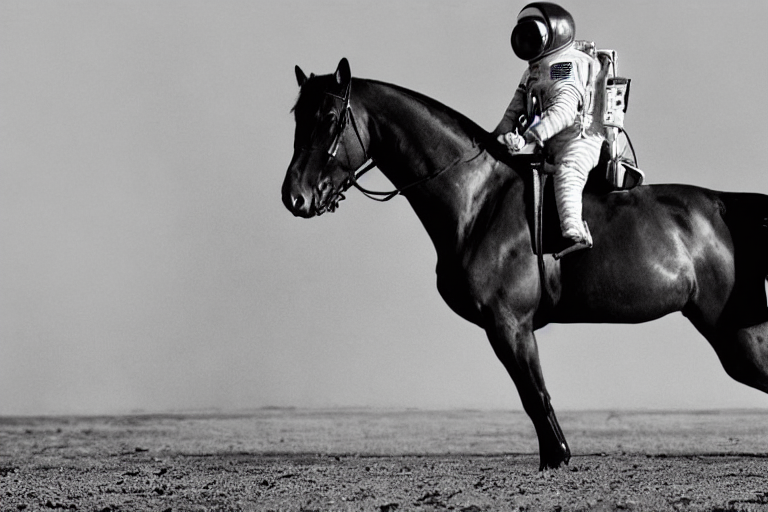

In [ ]:
prompt = "a photograph of an astronaut riding a horse"

image = pipe(prompt, height=512, width=768).images[0]
image